In [1]:
import requests
import os


from tqdm import tnrange, tqdm_notebook
def download_file(doi,ext):
	url = 'https://api.datacite.org/dois/'+doi+'/media'
	r = requests.get(url).json()
	netcdf_url = r['data'][0]['attributes']['url']
	r = requests.get(netcdf_url,stream=True)
	#Set file name
	fname = doi.split('/')[-1]+ext
	#Download file with progress bar
	if r.status_code == 403:
		print("File Unavailable")
	if 'content-length' not in r.headers:
		print("Did not get file")
	else:
		with open(fname, 'wb') as f:
			total_length = int(r.headers.get('content-length'))
			pbar = tnrange(int(total_length/1024), unit="B")
			for chunk in r.iter_content(chunk_size=1024):
				if chunk:
					pbar.update()
					f.write(chunk)
		return fname


#Pseudotime Packer & Zhu C. elegans data
#counts.mtx
download_file('10.22002/D1.2060','.gz')

#cells.csv
download_file('10.22002/D1.2061','.gz')

#genes.csv
download_file('10.22002/D1.2062','.gz')


#MERFISH data

#metadata.csv
download_file('10.22002/D1.2063','.gz')

#counts.h5ad
download_file('10.22002/D1.2064','.gz')

os.system("gunzip *.gz")

os.system("mv D1.2063 metadata.csv")
os.system("mv D1.2064 counts.h5ad")

/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:21: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


  0%|          | 0/14905 [00:00<?, ?B/s]

  0%|          | 0/561 [00:00<?, ?B/s]

  0%|          | 0/165 [00:00<?, ?B/s]

  0%|          | 0/9784 [00:00<?, ?B/s]

  0%|          | 0/59360 [00:00<?, ?B/s]

0

In [2]:

# !pip3 install --quiet anndata
# !pip3 install --quiet matplotlib
# !pip3 install --quiet scikit-learn

# !pip install --quiet scanpy==1.6.0
# !pip3 install --quiet umap-learn

## **Install Packages**

In [2]:
import statistics
import anndata 
import pandas as pd
import numpy as np
import networkx as nx

import random
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.neighbors import NeighborhoodComponentsAnalysis,NearestNeighbors, KNeighborsClassifier, KNeighborsRegressor
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import scale

import time
import scanpy as sc
import seaborn as sns
import umap
from scipy import stats
import scipy.io as sio
import matplotlib



matplotlib.rc('axes',edgecolor='black')
%matplotlib inline

sc.set_figure_params(dpi=125)
sns.set_style('white')

## **Import Data**

In [3]:
# General parameters
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams['axes.linewidth'] = 0.1

state = 42
ndims = 2

data_path = '.'

n_latent = 50
pcs = 50

## **Merfish Data**

In [4]:
counts = anndata.read(data_path+'/counts.h5ad')
print(counts)

cellMeta = pd.read_csv(data_path+'/metadata.csv')
print(cellMeta.head())

AnnData object with n_obs × n_vars = 280327 × 254
     Unnamed: 0  fovID     fov_x     fov_y       volume     center_x  \
0  1.000010e+37     13  4539.310  2986.899   992.830060  4738.397298   
1  1.000020e+38    290 -4016.860  1404.780   610.091871 -3964.711404   
2  1.000070e+38    113   750.406  1143.102   148.277718   805.843523   
3  1.000070e+38    432  1262.680 -3752.030   249.515471  1348.686198   
4  1.000090e+38    354 -3627.450 -1987.730  1779.831996 -3584.650904   

      center_y         slice_id         sample_id     label     subclass  \
0  3075.327399   mouse2_slice31  dataset2_sample4   Astro_1   Astrocytes   
1  1451.889047  mouse2_slice160  dataset2_sample5      Endo  Endothelial   
2  1215.035473  mouse2_slice109  dataset2_sample6       SMC          SMC   
3 -3589.955255   mouse1_slice71  dataset1_sample2      Endo  Endothelial   
4 -1883.105955  mouse2_slice219  dataset2_sample5  L23_IT_3       L23_IT   

     class_label  
0          Other  
1          Other  
2  

In [5]:
axisFontSize = 11
tickFontSize = 10
errwidth=1
figsize =(8,4)
dodge=0.4

In [6]:
cellMeta.columns

Index(['Unnamed: 0', 'fovID', 'fov_x', 'fov_y', 'volume', 'center_x',
       'center_y', 'slice_id', 'sample_id', 'label', 'subclass',
       'class_label'],
      dtype='object')

In [7]:
choice = np.unique(cellMeta.slice_id)[7] #7
choice

'mouse1_slice162'

In [8]:
counts.obs['slice'] = pd.Categorical(cellMeta.slice_id)
counts.obs['type'] = pd.Categorical(cellMeta.subclass)
counts.obs['x'] = list(cellMeta.center_x)
counts.obs['y'] = list(cellMeta.center_y)


In [9]:
sub = counts[counts.obs['slice'].isin([choice])]
print(sub)

#colors = np.random.rand(len(sub.obs['type']),3)
nanLabs = np.array([[np.nan]*len(sub.obs['type'])])

labs = np.array([list(sub.obs['type'])])
labs_cont = np.array([list(sub.obs['x']),list(sub.obs['y'])])

View of AnnData object with n_obs × n_vars = 6963 × 254
    obs: 'slice', 'type', 'x', 'y'


In [10]:
#colors = np.random.rand(len(adata2.obs['Cluster']),3)
cdict = {'Microglia':'#A778BC','L6_IT':'#EA95C1','Astrocytes':'#B6657E','Oligodendrocytes':'#B49599',
         'L23_IT':'#628EA2','OPC':'#72B9A5','L45_IT':'#71B7A2','Endothelial':'#7794C3','Pvalb':'#FD8085',
         'L6_IT_Car3':'#FAD1FC','L56_NP':'#93B09B','PVM':'#ECBDD2','L5_IT':'#ABA8DF',
         'L5_PT':'#D36486','Sst':'#8FE0B1','L6_CT':'#9589C4','Vip':'#CD83AC','VLMC':'#BBDBF2',
         'SMC':'#7A849E','other':'#A382BC','L6b':'#64D7F0','Pericytes':'#95BA98',
         'Lamp5':'#A3E169','Sncg':'#92B1DB','Sst_Chodl':'#81FAC9'}
colors = [cdict[i] for i in pd.unique(sub.obs['type'])]

In [11]:
sub.obs['type'].value_counts()

L45_IT              977
L23_IT              946
L6_CT               582
Astrocytes          546
Oligodendrocytes    522
Endothelial         505
L5_IT               441
L6_IT               439
other               204
Pericytes           195
L5_PT               185
Microglia           182
Pvalb               167
PVM                 164
VLMC                139
OPC                 131
L6_IT_Car3          123
SMC                 119
L6b                 104
Sst                  92
L56_NP               78
Lamp5                59
Vip                  53
Sncg                  5
Sst_Chodl             5
Name: type, dtype: int64

Make log-normalized, and scaled count matrices (separately)

In [12]:
orig_mat = sub.X

In [13]:
log_mat = np.log1p(sub.X)

In [14]:
sc.pp.log1p(sub)

#Center scale
sc.pp.scale(sub, max_value=10)

scaled_mat = sub.X

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:373: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


### **Generate all embeddings of data and Collect Metrics**

Get nearest neighbors in all embeddings

In [31]:
p = 1 #1 or 2, either will show the same trends
n_neigh = 15

In [32]:
#PCA 50D representation
tsvd = TruncatedSVD(n_components=pcs)
x_pca = tsvd.fit_transform(log_mat)

#t-SNE of PCA
tsne = TSNE(n_components = 2,perplexity=n_neigh,random_state=42)
tsnePCA = tsne.fit_transform(x_pca)

#t-SNE of ambient data
tsne = TSNE(n_components = 2,perplexity=n_neigh,random_state=42)
tsne2d = tsne.fit_transform(log_mat)


#umap of PCA
reducer = umap.UMAP(n_components = 2,random_state=42)
umapPCA = reducer.fit_transform(x_pca)

#umap of ambient data
reducer = umap.UMAP(n_components = 2,random_state=42)
umap2d = reducer.fit_transform(log_mat)

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


In [33]:
#Get 15 NNs for all embeddings, for tsne/UMAP (2d embedding) get 1000 nearest neighbors
nbrs = NearestNeighbors(n_neighbors=n_neigh, p=p).fit(log_mat)
distLog, nnLog = nbrs.kneighbors(log_mat)

nbrs = NearestNeighbors(n_neighbors=n_neigh, p=p).fit(x_pca)
distPCA, nnPCA = nbrs.kneighbors(x_pca)

#t-sne/umap + pca
nbrs = NearestNeighbors(n_neighbors=1000, p=p).fit(tsnePCA)
dist_tsnePCA, nn_tsnePCA = nbrs.kneighbors(tsnePCA)

nbrs = NearestNeighbors(n_neighbors=1000, p=p).fit(umapPCA)
dist_umapPCA, nn_umapPCA = nbrs.kneighbors(umapPCA)

#t-sne/umap straight to 2d
nbrs = NearestNeighbors(n_neighbors=1000, p=p).fit(tsne2d)
dist_tsne2d, nn_tsne2d = nbrs.kneighbors(tsne2d)

nbrs = NearestNeighbors(n_neighbors=1000, p=p).fit(umap2d)
dist_umap2d, nn_umap2d = nbrs.kneighbors(umap2d)

In [34]:
#Given (ambient) matrix and embedding space, find rank of each cell's neighbors from ambient space in neighbors from embedding space
#i.e. Find how many NNs it is necessary to expand to, to capture neighbors from ambient space
def getRankAdj(mat,embed,n_neigh=15):
  rankAdj = np.zeros((mat.shape[0],mat.shape[0]))

  for c in range(mat.shape[0]):
    for i in range(n_neigh):
      toFind = mat[c,i]

      if toFind in embed[c,:].tolist():
        rankAdj[c,toFind] = np.log(embed[c,:].tolist().index(toFind)+1)
      else:
        rankAdj[c,toFind] = np.log(1001)

  return rankAdj



In [35]:
#Make numpy array of cellsxneighbors with each cell = position in 2d embedding neighborhood (t-sne or UMAP)

#Weighted Adj matrices for log_mat, x_pca versus tsnePCA, umapPCA, tsne2d, umap2d (8 total)
#MAYBE don't add color to cells -> put plots next to each other, maybe do shade instead of width

origs = [nnLog,nnPCA]
embeds = [nn_tsnePCA ,nn_umapPCA,nn_tsne2d, nn_umap2d]
labels = ['Log on PCA_t-SNE','Log on PCA_UMAP','Log on t-SNE','Log on UMAP',
          'PCA 50D on PCA_t-SNE','PCA 50D on PCA_UMAP','PCA 50D on t-SNE','PCA 50D on UMAP']

allAdj = []
for i in origs:
  for j in embeds:
    allAdj += [getRankAdj(i,j,n_neigh=15)]




In [36]:
#Make numpy array of cellsxneighbors with each cell = position in 2d embedding neighborhood (t-sne or UMAP)

#Weighted Adj matrices for tsnePCA, umapPCA versus tsnePCA, umapPCA, tsne2d, umap2d (8 total)
origs_2d = [nn_tsnePCA,nn_umapPCA]
embeds_2d = [nn_tsnePCA ,nn_umapPCA,nn_tsne2d, nn_umap2d]
labels_2d = ['PCA_t-SNE on PCA_t-SNE','PCA_t-SNE on PCA_UMAP','PCA_t-SNE on t-SNE','PCA_t-SNE on UMAP',
          'PCA_UMAP on PCA_t-SNE','PCA_UMAP on PCA_UMAP','PCA_UMAP on t-SNE','PCA_UMAP on UMAP']

allAdj_2d = []
for i in origs_2d:
  for j in embeds_2d:
    allAdj_2d += [getRankAdj(i,j,n_neigh=15)]



In [37]:
#Make numpy array of cellsxneighbors with each cell = position in 2d embedding neighborhood (t-sne or UMAP)

#Weighted Adj matrices for tsnePCA, umapPCA versus tsnePCA, umapPCA, tsne2d, umap2d (8 total)
origs_2d_2 = [nn_tsne2d,nn_umap2d]
embeds_2d_2 = [nn_tsnePCA ,nn_umapPCA,nn_tsne2d, nn_umap2d]
labels_2d_2 = ['t-SNE on PCA_t-SNE',' t-SNE on PCA_UMAP',' t-SNE on t-SNE',' t-SNE on UMAP',
          'UMAP on PCA_t-SNE','UMAP on PCA_UMAP','UMAP on t-SNE','UMAP on UMAP']

allAdj_2d_2 = []
for i in origs_2d_2:
  for j in embeds_2d_2:
    allAdj_2d_2 += [getRankAdj(i,j,n_neigh=15)]



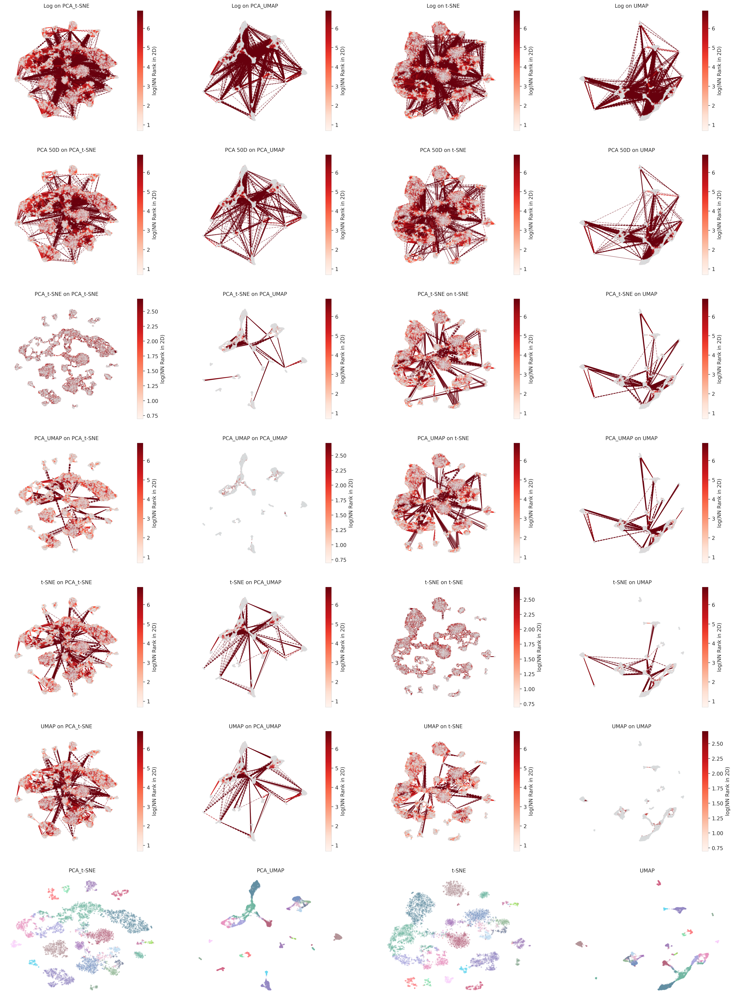

In [38]:
#MAYBE Makes lines dashed if in edge is between same cell type or not
coords = [tsnePCA ,umapPCA,tsne2d, umap2d]*6

adjs = allAdj+allAdj_2d+allAdj_2d_2
labs = labels+labels_2d+labels_2d_2

# add axis
fig, axs = plt.subplots(7, 4, figsize=(25,35))

ax1 = [0]*4+[1]*4+[2]*4+[3]*4+[4]*4+[5]*4+[6]*4
ax2 = [0,1,2,3]*7

for i in range(len(coords)):
  at = coords[i].T 
  points = list(zip(at[0],at[1]))

  pos = {points.index(point): point for point in points}
  allColors  = [cdict[x] for x in sub.obs['type']]

  #Make two adj matrices, set to 0 if not in same cell type and vice versa
  #For each cell, set all columns to 0 if in same cell type
  a_same = adjs[i].copy()
  a_notSame = adjs[i].copy()
  fracs = []
  for cell in range(a_same.shape[0]):
    c_type = sub.obs['type'][cell]
    a_same[cell,~sub.obs['type'].isin([c_type])] = 0
    a_notSame[cell,sub.obs['type'].isin([c_type])] = 0
    #fracs += [np.sum(sub.obs['type'][adjs[i][cell,:]>0].isin([c_type]))/np.sum((adjs[i][cell,:]>0))]

  # print(np.sum((adjs[i][cell,:]>0)))
  # plt.hist(fracs)
    


  G = nx.from_numpy_array(a_same)
  G.edges(data=True)


  edges = G.edges()
  #colors = [G[u][v]['color'] for u,v in edges]
  weights = [G[u][v]['weight'] for u,v in edges]


  #Graph for not the same cell type
  G2 = nx.from_numpy_array(a_notSame)
  G2.edges(data=True)
  edges2 = G2.edges()
  #colors = [G[u][v]['color'] for u,v in edges]
  weights2 = [G2[u][v]['weight'] for u,v in edges2]


  cmap=plt.cm.Reds
  vmin = min(weights+weights2)
  vmax = max(weights+weights2)

  #Draw nodes first, then edges on top
  nx.draw_networkx_nodes(G, pos=pos,node_size=3,node_color="#DCDFE0", ax=axs[ax1[i],ax2[i]],alpha=0.2) #edge_color=colors, width=weights,node_color=allColors
  
  nx.draw_networkx_edges(G2, pos=pos,edge_color=weights2,edge_cmap=cmap, ax=axs[ax1[i],ax2[i]],alpha=0.5,style='dashed') #Between cell type
  nx.draw_networkx_edges(G, pos=pos,edge_color=weights,edge_cmap=cmap, ax=axs[ax1[i],ax2[i]],alpha=0.5) #Within cell type connections
  
  sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin = vmin, vmax=vmax))
  sm._A = []

  # draw edge weights

  #plt.axis("on")
  axs[ax1[i],ax2[i]].set_title(labs[i],fontsize=10)
  cbar = fig.colorbar(sm,ax=axs[ax1[i],ax2[i]])  
  cbar.ax.tick_params(labelsize=10) 
  cbar.set_label(label='log(NN Rank in 2D)',size=10)
  axs[ax1[i],ax2[i]].set_axis_off()
  # ax.set_xlim(0, 11)
  # ax.set_ylim(0,11)


#Plot 2D embeddings with cell type colors for referene
coords2 = [tsnePCA ,umapPCA,tsne2d, umap2d]
labs2 = ['PCA_t-SNE','PCA_UMAP','t-SNE','UMAP']


for i in range(len(coords2)):
  axs[ax1[i+24],ax2[i+24]].scatter(coords2[i][:,0],coords2[i][:,1], s=3,c=allColors, alpha=0.2)

  axs[ax1[i+24],ax2[i+24]].set_title(labs2[i],fontsize=10)

  #axs[ax1[i+16],ax2[i+16]].legend(loc='center right',bbox_to_anchor=(1, 0.5),prop={'size': 8},frameon=False,ncol=2)
  axs[ax1[i+24],ax2[i+24]].set_axis_off()


plt.savefig('knnOverlayL1.pdf')

